# Prediction of  Bike Rental

### Business Case :-

> * This project focuses on developing a  machine learning  model to predict daily bike rental counts based on historical usage data and contextual features such as weather conditions, temperature, humidity, seasonality, holiday indicators, and working days. 

> * Accurately forecasting rental demand is essential for optimizing bike availability, preventing station overcrowding or shortages, and ensuring efficient resource utilization. Without a predictive system, bike-sharing services risk operational inefficiencies, customer dissatisfaction, and revenue loss due to unmet demand or underused inventory. By solving this problem, the business can make data-driven decisions to improve service quality and operational performance.

#### Data Understanding

> *The dataset contains 731 daily records from a bike-sharing system over two years (2011–2012). Each entry includes information on date, season, weather, temperature, humidity, and indicators like holidays and working days. The target variable is cnt, representing the total number of bikes rented (casual + registered users). Key features such as temp, hum, and windspeed are normalized. 


In [1]:
# Importing the required libraries
import numpy as np  # For numerical computations and working with arrays
import pandas as pd  # For data manipulation and analysis
import matplotlib.pyplot as plt  # For creating static visualizations
import seaborn as sns  # For advanced visualizations and styling
import warnings  # For managing warnings in Python

# Ignore all warnings to keep the notebook clean
warnings.filterwarnings("ignore")

In [2]:
# Load the dataset from a CSV file
d1 = pd.read_csv('day.csv') # Reads the 'day.csv' file into a DataFrame named 'data'
d2 = pd.read_csv('hour.csv') # Reads the 'hour.csv' file into a DataFrame named 'data'

In [5]:
d1

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,727,2012-12-27,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247,1867,2114
727,728,2012-12-28,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095
728,729,2012-12-29,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341
729,730,2012-12-30,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364,1432,1796


In [7]:
d2

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61


In [9]:
d1.head()  # Display the first few rows of the DataFrame

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


In [11]:
d2.head()  # Display the first few rows of the DataFrame

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [13]:
d1.tail()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
726,727,2012-12-27,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247,1867,2114
727,728,2012-12-28,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095
728,729,2012-12-29,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341
729,730,2012-12-30,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364,1432,1796
730,731,2012-12-31,1,1,12,0,1,1,2,0.215833,0.223487,0.577500,0.154846,439,2290,2729


In [15]:
d2.tail()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61
17378,17379,2012-12-31,1,1,12,23,0,1,1,1,0.26,0.2727,0.65,0.1343,12,37,49


In [17]:
d1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     731 non-null    int64  
 1   dteday      731 non-null    object 
 2   season      731 non-null    int64  
 3   yr          731 non-null    int64  
 4   mnth        731 non-null    int64  
 5   holiday     731 non-null    int64  
 6   weekday     731 non-null    int64  
 7   workingday  731 non-null    int64  
 8   weathersit  731 non-null    int64  
 9   temp        731 non-null    float64
 10  atemp       731 non-null    float64
 11  hum         731 non-null    float64
 12  windspeed   731 non-null    float64
 13  casual      731 non-null    int64  
 14  registered  731 non-null    int64  
 15  cnt         731 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.5+ KB


In [19]:
d2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


In [21]:
d1.describe()

,instant,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,366.000000,2.496580,0.500684,6.519836,0.028728,2.997264,0.683995,1.395349,0.495385,0.474354,0.627894,0.190486,848.176471,3656.172367,4504.348837
std,211.165812,1.110807,0.500342,3.451913,0.167155,2.004787,0.465233,0.544894,0.183051,0.162961,0.142429,0.077498,686.622488,1560.256377,1937.211452
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.059130,0.079070,0.000000,0.022392,2.000000,20.000000,22.000000
25%,183.500000,2.000000,0.000000,4.000000,0.000000,1.000000,0.000000,1.000000,0.337083,0.337842,0.520000,0.134950,315.500000,2497.000000,3152.000000
50%,366.000000,3.000000,1.000000,7.000000,0.000000,3.000000,1.000000,1.000000,0.498333,0.486733,0.626667,0.180975,713.000000,3662.000000,4548.000000
75%,548.500000,3.000000,1.000000,10.000000,0.000000,5.000000,1.000000,2.000000,0.655417,0.608602,0.730209,0.233214,1096.000000,4776.500000,5956.000000
max,731.000000,4.000000,1.000000,12.000000,1.000000,6.000000,1.000000,3.000000,0.861667,0.840896,0.972500,0.507463,3410.000000,6946.000000,8714.000000


In [23]:
d2.describe()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,5017.0295,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.0000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4345.5000,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,8690.0000,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,13034.5000,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000
max,17379.0000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


In [25]:
d1.describe(include="O") # To get a summary of object (categorical) column

,dteday
count,731
unique,731
top,2011-01-01
freq,1


In [27]:
d2.describe(include="O") # To get a summary of object (categorical) column

,dteday
count,17379
unique,731
top,2011-01-01
freq,24


# Exploratory Data Analysis

#### Definition:
  > Exploratory Data Analysis (EDA) is a process for analyzing and summarizing datasets to uncover patterns, trends, and relationships. It uses descriptive statistics and visualizations, such as charts and graphs, to identify key characteristics and detect outliers.

#### Distributed in three parts:
> * **Univariate Analysis**:- Univariate analysis is essential for gaining insights of individual variables, which can help in further analysis and decision-making.
> * **Bivariate Analysis**:- Bivariate analysis is for understanding how two variables influence each other, which can help decision-making and in further analysis.
> * **Multivariate Analysis**:- Multivariate analysis is for understanding the relation of multiple factors, to get more insights and also for decision-making in complex datasets.

In [32]:
d1.columns # View columns in d1

Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

In [34]:
d2.columns # View columns in d2

Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

In [36]:
# Convert 'dteday' to datetime and then to int64
d2['dteday'] = pd.to_datetime(d2['dteday']).astype('int64') 

### Univeriant Analysis:-
> * Univariate analysis involves the examination of a single variable to find patterns in the data. It focuses on one variable at a time, to understand its distribution, central tendency (mean, median, mode) and  variation (range, variance, standard deviation) can also be calculated.

In [39]:
d1.columns

Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

In [41]:
# Convert 'dteday' to datetime and then to int64
d1['dteday'] = pd.to_datetime(d1['dteday']).astype('int64') 

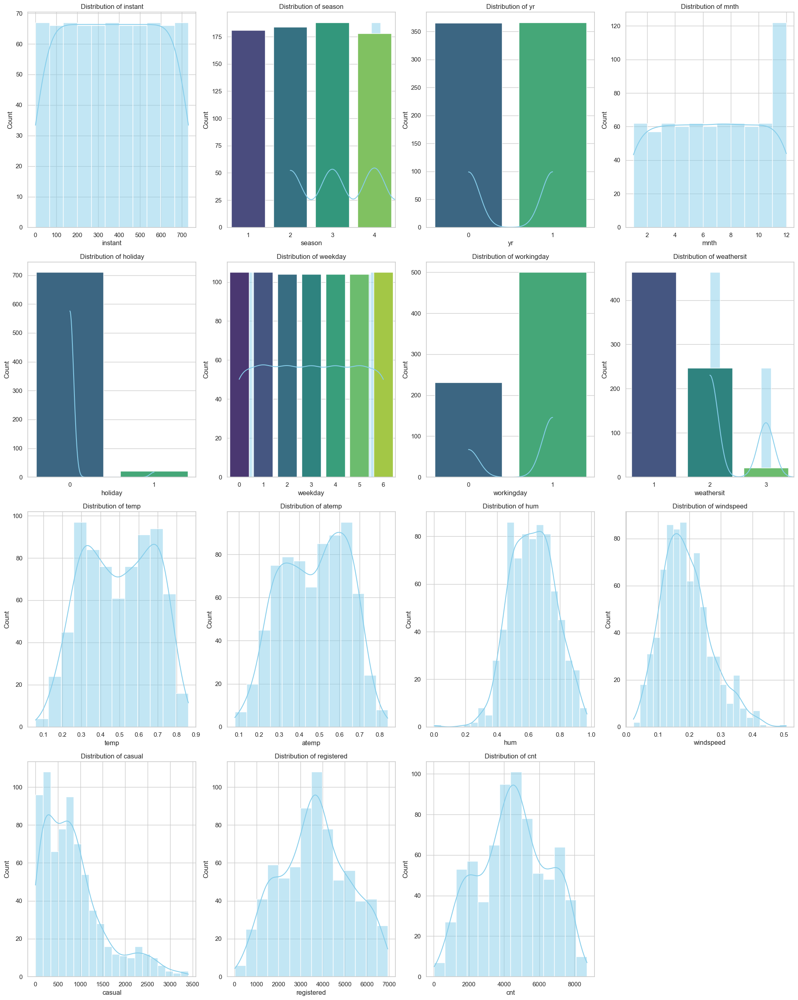

In [43]:
feature = d1.columns.drop('dteday')  # Drop specified rows or columns from the DataFrame

# Set plot style
sns.set(style="whitegrid")  # Create a plot using Seaborn
plt.figure(figsize=(20, 25))  # Customize or display the plot

num = 1

for i in feature:
    plt.subplot(4,4,num)  # Plot the data using a specified type of plot
    if num <= 16:
        sns.histplot(data=d1[i], kde=True, color='skyblue')  # Plot the data using a specified type of plot
        if d1[i].nunique() <= 10:
            sns.countplot(data=d1,x=i, palette='viridis')  # Plot the data using a specified type of plot
        plt.title(f'Distribution of {i}')  # Customize or display the plot
        plt.xlabel(i)  # Customize or display the plot
        plt.ylabel('Count')  # Customize or display the plot
    num += 1
    
plt.tight_layout()  # Customize or display the plot
plt.show()  # Customize or display the plot

#### **Analysis**:-

> * Season is nearly evenly distributed.
> * yr and weekday are balanced data.
> * mnth has almost uniform distribution.
> * holiday is strongly imbalanced distribution.
> * weekday is uniform distribution.
> * temp & atemp are Bimodal distribution.
> *  hum is normally left skewned distribution.
> *  windspeed is Right-skewed distribution.
> *  casual is Right-skewed distribution.
> *  registered neary normal distribution with strong peak
> *  cnt close to normal distribution

In [46]:
# instant is noot needed in both dataset
d2.drop('instant',axis=1,inplace=True)  # Drop specified rows or columns from the DataFrame
d1.drop('instant',axis=1,inplace=True)  # Drop specified rows or columns from the DataFrame

In [48]:
print(type(d1))  # Print the output to the console

<class 'pandas.core.frame.DataFrame'>


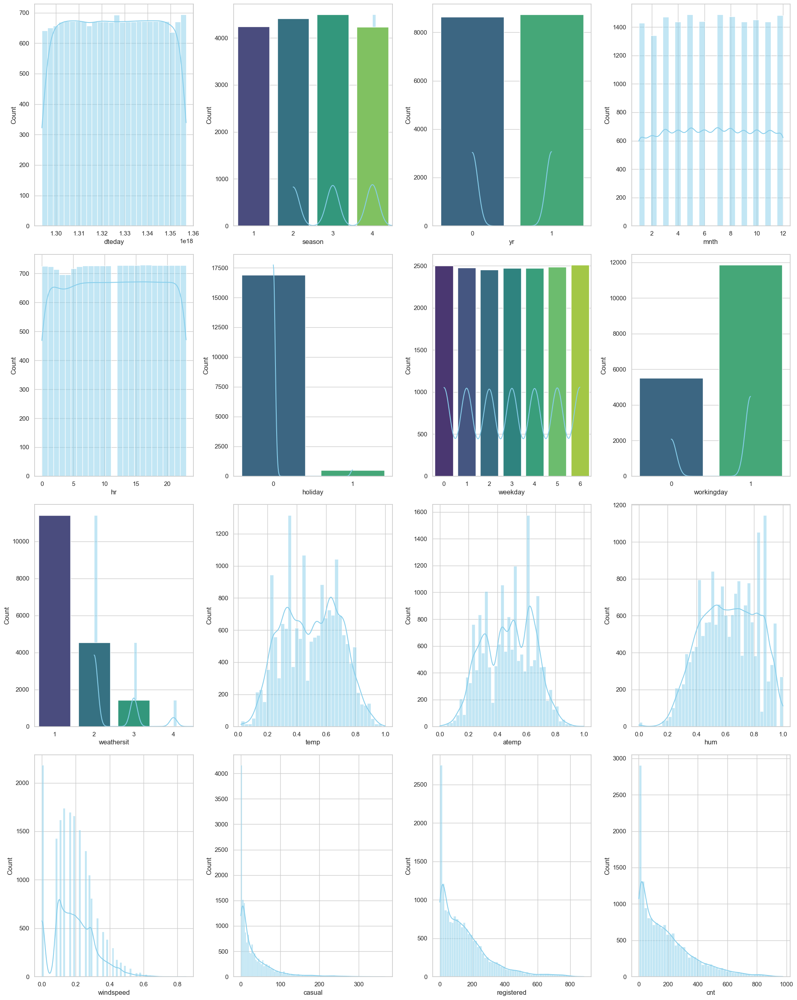

In [50]:
feature = d2.columns

# Set plot style
sns.set(style="whitegrid")  # Create a plot using Seaborn
plt.figure(figsize=(20, 25))  # Customize or display the plot
num = 1

for i in feature:
    plt.subplot(4,4,num)  # Plot the data using a specified type of plot
    if num <= 16:
        sns.histplot(data=d2[i], kde=True, color='skyblue')  # Plot the data using a specified type of plot
        if d2[i].nunique() <= 10:
            sns.countplot(data=d2,x=i, palette='viridis')  # Plot the data using a specified type of plot
        plt.xlabel(i)  # Customize or display the plot
        plt.ylabel('Count')  # Customize or display the plot
    num += 1
     
    
plt.tight_layout()  # Customize or display the plot
plt.show()  # Customize or display the plot

#### **Analysis**:-

> * Season is nearly evenly distributed.
> * yr and weekday are balanced data.
> * mnth has evenly distributed.
> * hr  is  close to uniform.
> * holiday is strongly imbalanced distribution.
> * weekday is uniform distribution.
> * temp & atemp are Bimodal distribution.
> *  hum is uniform left skewned distribution.
> *  windspeed,casual,registered & cnt  are Right-skewed distribution.

### Multivariant Analysis
> * Multivariate analysis involves the examination of three or more variables simultaneously to understand complex relationships and patterns in the data. It focuses on how multiple variables interact with each other and their combined effects on outcomes. 

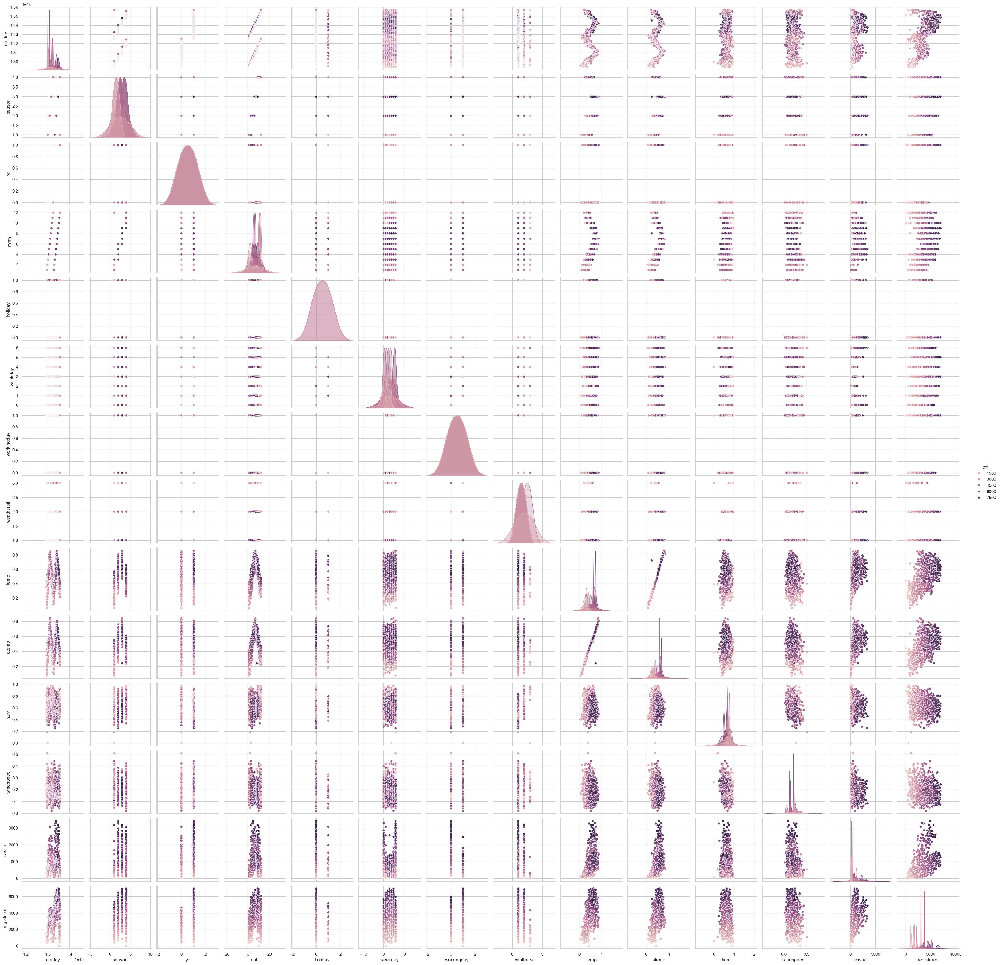

In [53]:
sns.pairplot(d1, hue="cnt")  # pairwise scatter plots for all numerical columns 

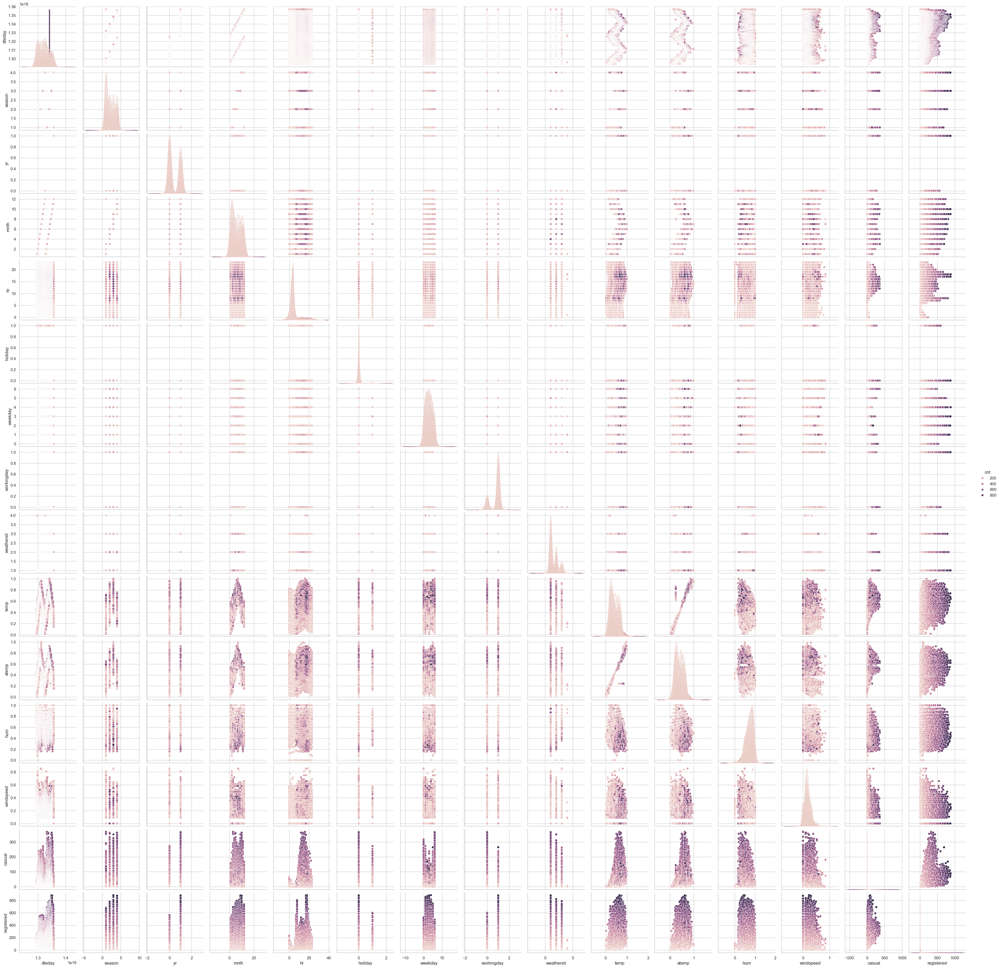

In [54]:
sns.pairplot(d2, hue="cnt")  # pairwise scatter plots for all numerical columns 

# Feature Engineering

#### Definition:

  > Feature engineering is the process of creating, modifying, or selecting features. It involve removing outliers, transforming them and also eliminating features that do not contribute meaningful information to the model, Applying transformations to make features more suitable for modeling, and retain the most impactful features, ensuring the model focuses on the most informative inputs. 

### 1.Data Preprocessing
> Data preprocessing is the process of cleaning, transforming, and organizing raw data into a suitable format for analysis or machine learning. It involves several key steps like data cleaning ,data transformation , change in any data type also for dimensionality reduction.

In [61]:
# Finding missing values
d1.isnull().sum()

dteday        0
season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [63]:
# Finding missing values
d2.isnull().sum()

dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [65]:
# create indivisual Day
d1["Year"] = pd.to_datetime(d1["dteday"]).dt.year # create year column
d1["Day"] = pd.to_datetime(d1["dteday"]).dt.day  # create day column

In [67]:
# create indivisual Day
d2["Year"] = pd.to_datetime(d2["dteday"]).dt.year # create year column
d2["Day"] = pd.to_datetime(d2["dteday"]).dt.day  # create day column

In [69]:
d1.head() # Displays the first 5 rows

,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,Year,Day
0,1293840000000000000,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985,2011,1
1,1293926400000000000,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801,2011,2
2,1294012800000000000,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349,2011,3
3,1294099200000000000,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562,2011,4
4,1294185600000000000,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600,2011,5


In [71]:
d2.head() # Displays the first 5 rows

,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,Year,Day
0,1293840000000000000,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16,2011,1
1,1293840000000000000,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40,2011,1
2,1293840000000000000,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32,2011,1
3,1293840000000000000,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13,2011,1
4,1293840000000000000,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1,2011,1


In [73]:
d1.drop("dteday",axis=1,inplace=True) # Drop unnecessary columns from data

In [75]:
d2.drop("dteday",axis=1,inplace=True) # Drop unnecessary columns from data

In [77]:
d1.head() # Displays the first 5 rows

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,Year,Day
0,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985,2011,1
1,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801,2011,2
2,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349,2011,3
3,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562,2011,4
4,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600,2011,5


In [79]:
d2.head() # Displays the first 5 rows

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,Year,Day
0,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16,2011,1
1,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40,2011,1
2,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32,2011,1
3,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13,2011,1
4,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1,2011,1


In [81]:
d1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   season      731 non-null    int64  
 1   yr          731 non-null    int64  
 2   mnth        731 non-null    int64  
 3   holiday     731 non-null    int64  
 4   weekday     731 non-null    int64  
 5   workingday  731 non-null    int64  
 6   weathersit  731 non-null    int64  
 7   temp        731 non-null    float64
 8   atemp       731 non-null    float64
 9   hum         731 non-null    float64
 10  windspeed   731 non-null    float64
 11  casual      731 non-null    int64  
 12  registered  731 non-null    int64  
 13  cnt         731 non-null    int64  
 14  Year        731 non-null    int32  
 15  Day         731 non-null    int32  
dtypes: float64(4), int32(2), int64(10)
memory usage: 85.8 KB


In [83]:
d2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   season      17379 non-null  int64  
 1   yr          17379 non-null  int64  
 2   mnth        17379 non-null  int64  
 3   hr          17379 non-null  int64  
 4   holiday     17379 non-null  int64  
 5   weekday     17379 non-null  int64  
 6   workingday  17379 non-null  int64  
 7   weathersit  17379 non-null  int64  
 8   temp        17379 non-null  float64
 9   atemp       17379 non-null  float64
 10  hum         17379 non-null  float64
 11  windspeed   17379 non-null  float64
 12  casual      17379 non-null  int64  
 13  registered  17379 non-null  int64  
 14  cnt         17379 non-null  int64  
 15  Year        17379 non-null  int32  
 16  Day         17379 non-null  int32  
dtypes: float64(4), int32(2), int64(11)
memory usage: 2.1 MB


In [85]:
continues_col1 = d1.drop('Day',axis=1)  # Drop specified rows or columns from the DataFrame

In [87]:
continues_col1

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,Year
0,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985,2011
1,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801,2011
2,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349,2011
3,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562,2011
4,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247,1867,2114,2012
727,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095,2012
728,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341,2012
729,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364,1432,1796,2012


In [89]:
continues_col2 = d2.drop('Day',axis=1)  # Drop specified rows or columns from the DataFrame

#### **Removing/Handling Outliers**
>* Removing outliers is an important step in data preprocessing to ensure data quality. Outliers are data points that differ from the rest samples. To manage, we can identify outliers using methods like the Z-score or Interquartile Range (IQR). you can either remove them, transform them using log, or impute them with the mean or median. Properly handling outliers helps improve model accuracy and analysis.


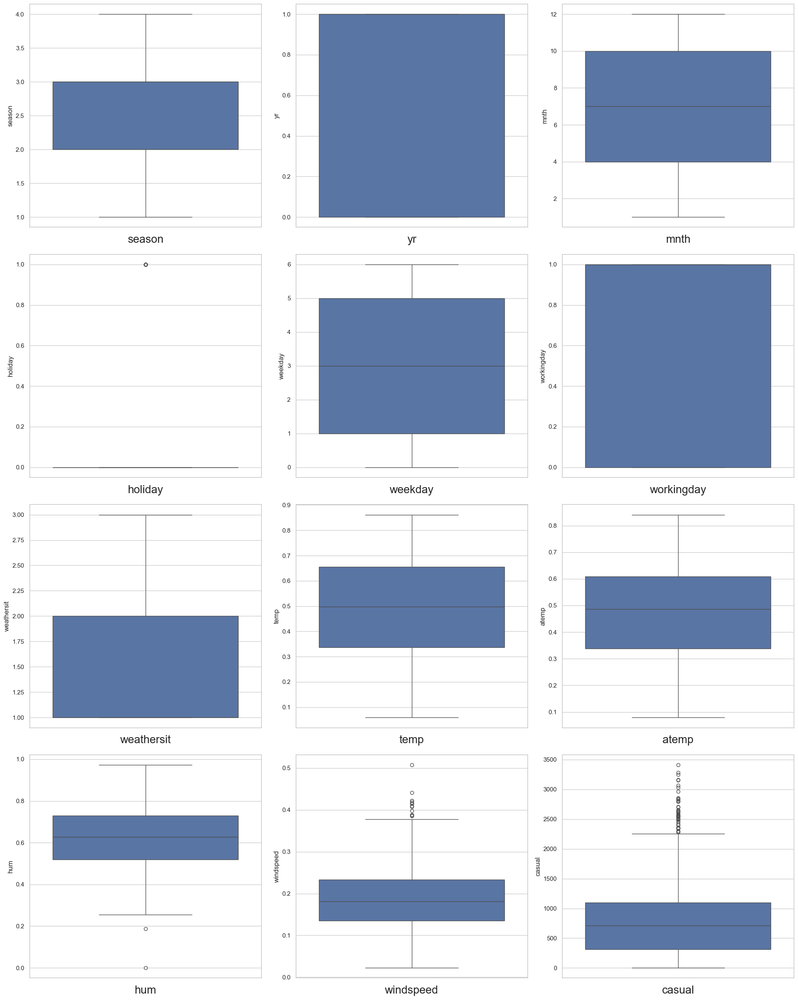

In [92]:
plt.figure(figsize=(20,25))  # Customize or display the plot
num = 1

for i in continues_col1:
    if num <= 12:
        plt.subplot(4,3,num)  # Plot the data using a specified type of plot
        sns.boxplot(continues_col1[i])  # Plot the data using a specified type of plot
        plt.xlabel(i, fontsize=20)  # Label the x-axis
    num += 1
plt.tight_layout()  # Adjust layout for better spacing

#### **Analysis**:-
> * Here outliers can be seen in hum, windspeed, casual (features).
> * Here casual (feature) posses maximum outliers.
> * Here hum (feature) posses minimum outliers.

<Axes: xlabel='hum'>

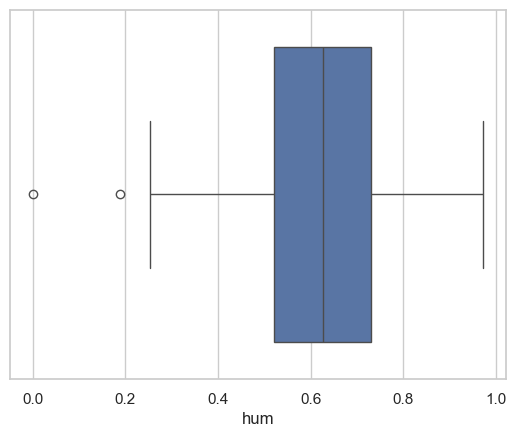

In [95]:
sns.boxplot(x=d1.hum) # Boxplot for the hum column to check the outliers

In [97]:
d1.hum.mean()  # Calculate the mean of the selected data

0.6278940629274967

In [99]:
# For replacing values
d1.loc[d1['hum'] < 0.2 , 'hum'] 

49    0.187917
68    0.000000
Name: hum, dtype: float64

In [101]:
# For replacing values
d1.loc[d1['hum'] < 0.2, 'hum'] = 0.6278940629274967

<Axes: xlabel='hum'>

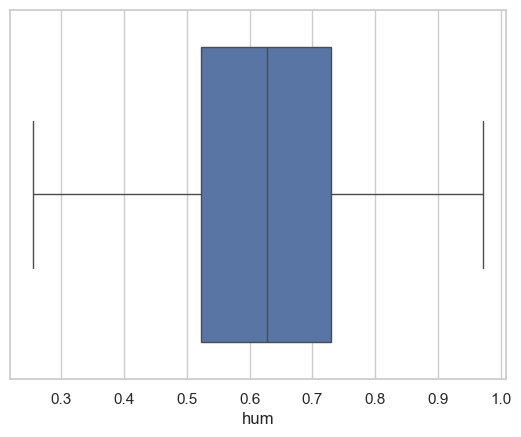

In [103]:
sns.boxplot(x=d1.hum) # After removing outliers   

<Axes: xlabel='windspeed'>

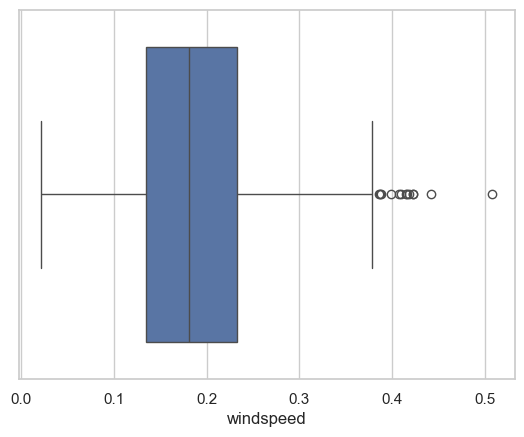

In [105]:
sns.boxplot(x=d1.windspeed) # Boxplot for the windspeed column to check the outliers

In [107]:
d1.loc[d1['windspeed']>0.3,'windspeed']

8      0.361950
11     0.304627
12     0.301000
20     0.353242
38     0.361950
         ...   
720    0.374383
721    0.407346
725    0.316546
726    0.350133
729    0.350754
Name: windspeed, Length: 71, dtype: float64

In [109]:
np.mean(d1['windspeed']) # Calculate the mean of the 'windspeed' column as is follows noramal distribution

0.190486211627907

In [111]:
# For replacing values
d1.loc[d1['windspeed']>0.3,'windspeed'] = 0.190486211627907 

<Axes: xlabel='windspeed'>

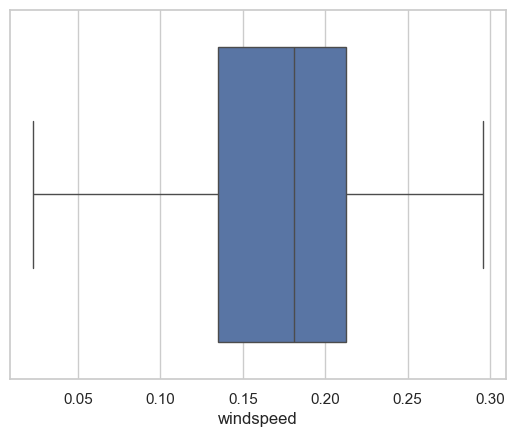

In [113]:
sns.boxplot(x=d1.windspeed) # After removing outliers

<Axes: xlabel='casual'>

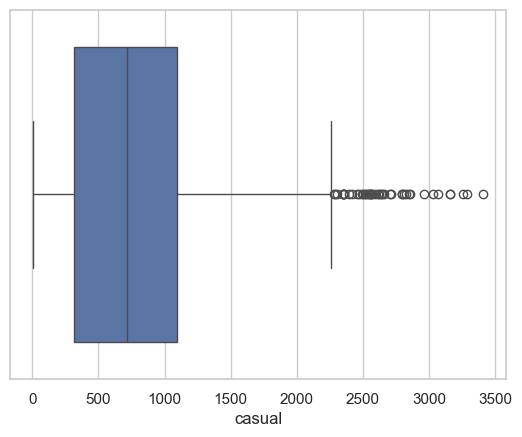

In [115]:
sns.boxplot(x=d1.casual) # Boxplot for the casual column to check the outliers

In [117]:
Q1 = d1['casual'].quantile(0.25)
Q3 = d1['casual'].quantile(0.75)
IQR = Q3- Q1
lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
d1.loc[(d1['casual']>upper_bound) | (d1['casual']<lower_bound),'casual'] = np.median(d1.casual)

<Axes: xlabel='casual'>

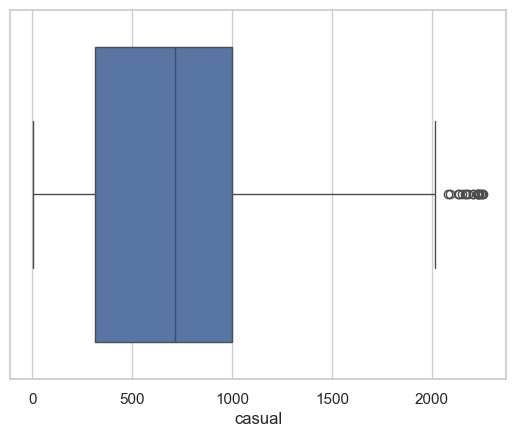

In [119]:
sns.boxplot(x=d1.casual)  # Plot the data using a specified type of plot

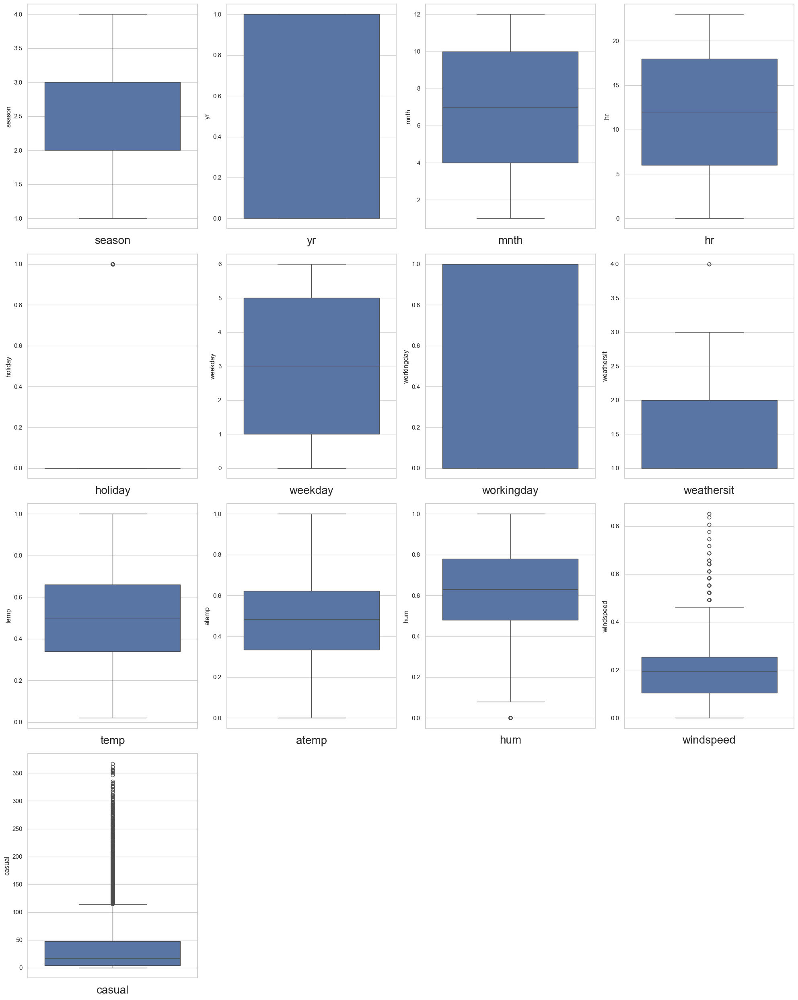

In [121]:
plt.figure(figsize=(20,25))  # Customize or display the plot
num = 1

for i in continues_col2:
    if num <= 13:
        plt.subplot(4,4,num)  # Plot the data using a specified type of plot
        sns.boxplot(continues_col2[i])  # Plot the data using a specified type of plot
        plt.xlabel(i,fontsize=20)  # Customize or display the plot
    num += 1

plt.tight_layout()  # Customize or display the plot

#### **Analysis**:-
> * Here outliers can be seen in weathersit,hum, windspeed, casual (features) and cnt.
> * Here casual (feature) posses maximum outliers.
> * Here weathersit (feature) posses minimum outliers.

<Axes: xlabel='weathersit'>

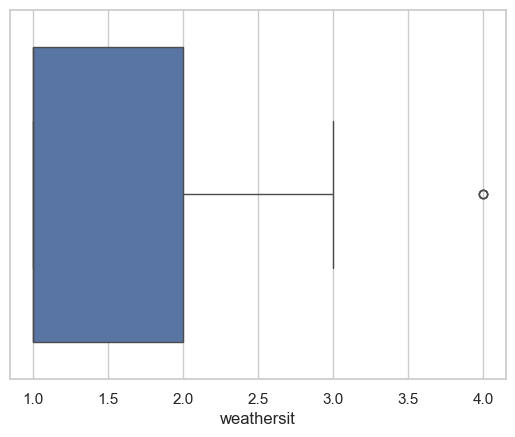

In [124]:
sns.boxplot(x=d2.weathersit) # Boxplot for the hum column to check the outliers

In [126]:
d2.loc[d2['weathersit']  > 3 , 'weathersit'] 

585     4
8854    4
9123    4
Name: weathersit, dtype: int64

In [128]:
d2.weathersit.value_counts()  # Count the number of unique values for each column

weathersit
1    11413
2     4544
3     1419
4        3
Name: count, dtype: int64

In [130]:
d2.loc[d2['weathersit']  > 3 , 'weathersit'] = 1

<Axes: xlabel='weathersit'>

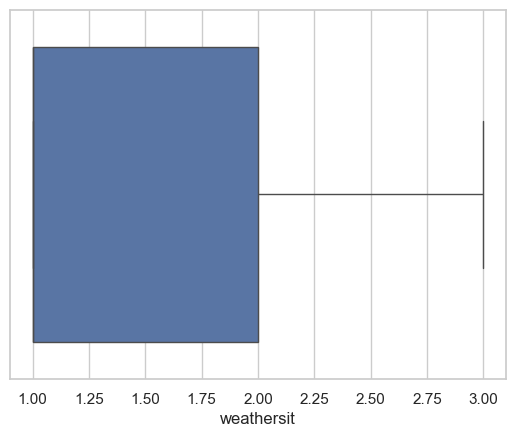

In [132]:
sns.boxplot(x=d2.weathersit)  # Plot the data using a specified type of plot

<Axes: xlabel='hum'>

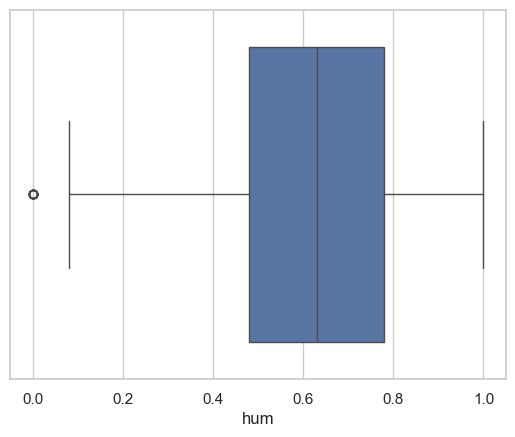

In [134]:
sns.boxplot(x=d2.hum) # Boxplot for the hum column to check the outliers

In [136]:
d2.hum.mean()  # Calculate the mean of the selected data

0.6272288394038783

In [138]:
Q1 = d2['hum'].quantile(0.25)
Q3 = d2['hum'].quantile(0.75)
IQR = Q3- Q1
lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
d2.loc[(d2['hum']>upper_bound) | (d2['hum']<lower_bound),'hum'] = np.median(d2.hum)

<Axes: xlabel='hum'>

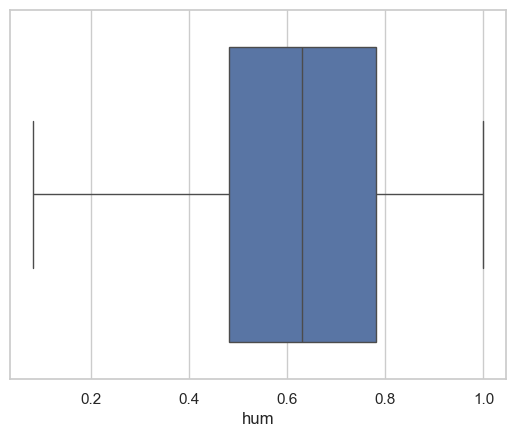

In [140]:
sns.boxplot(x=d2.hum) # After removing outliers   

<Axes: xlabel='windspeed'>

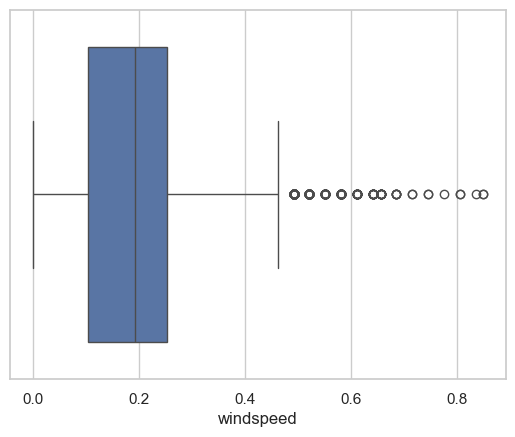

In [142]:
sns.boxplot(x=d2.windspeed) # Boxplot for the windspeed column to check the outliers

In [144]:
d2.loc[d2['windspeed']>0.4,'windspeed']

42       0.4478
48       0.4179
175      0.4925
176      0.4478
177      0.4478
          ...  
17342    0.4179
17343    0.5821
17344    0.6567
17345    0.4627
17347    0.4179
Name: windspeed, Length: 960, dtype: float64

In [146]:
Q1 = d2['windspeed'].quantile(0.25)
Q3 = d2['windspeed'].quantile(0.75)
IQR = Q3- Q1
lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
d2.loc[(d2['windspeed']>upper_bound) | (d2['windspeed']<lower_bound),'windspeed'] = np.median(d2.windspeed)

<Axes: xlabel='windspeed'>

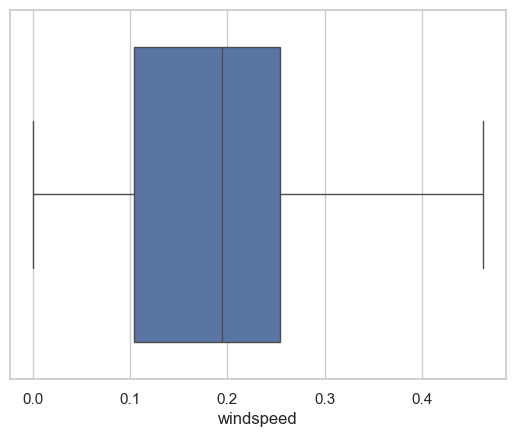

In [148]:
sns.boxplot(x=d2.windspeed) # After removing outliers

<Axes: xlabel='casual'>

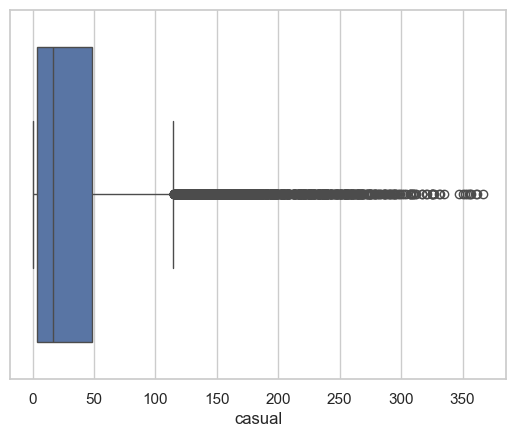

In [150]:
sns.boxplot(x=d2.casual) # Boxplot for the casual column to check the outliers

In [152]:
Q1 = d2['casual'].quantile(0.25)
Q3 = d2['casual'].quantile(0.75)
IQR = Q3- Q1
lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
d2.loc[(d2['casual']>upper_bound) | (d2['casual']<lower_bound),'casual'] = np.median(d2.casual)

<Axes: xlabel='casual'>

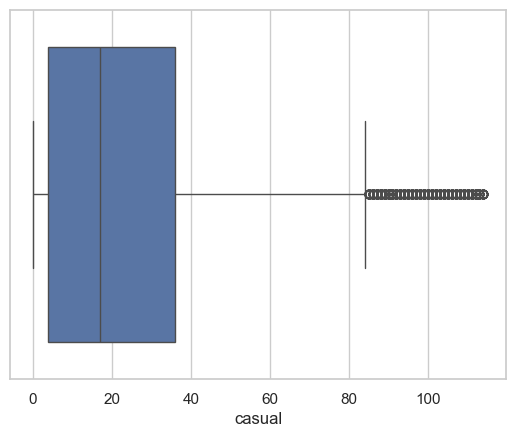

In [154]:
sns.boxplot(x=d2.casual)  # Plot the data using a specified type of plot

### 2. Feature Selection
Feature selection is the process of choosing the most important features (or variables) from a larger set to use in a machine learning model. Helps the model make better predictions. It also Reduces Overfitting of model and makes the model faster to train and easier to understand.

<Axes: >

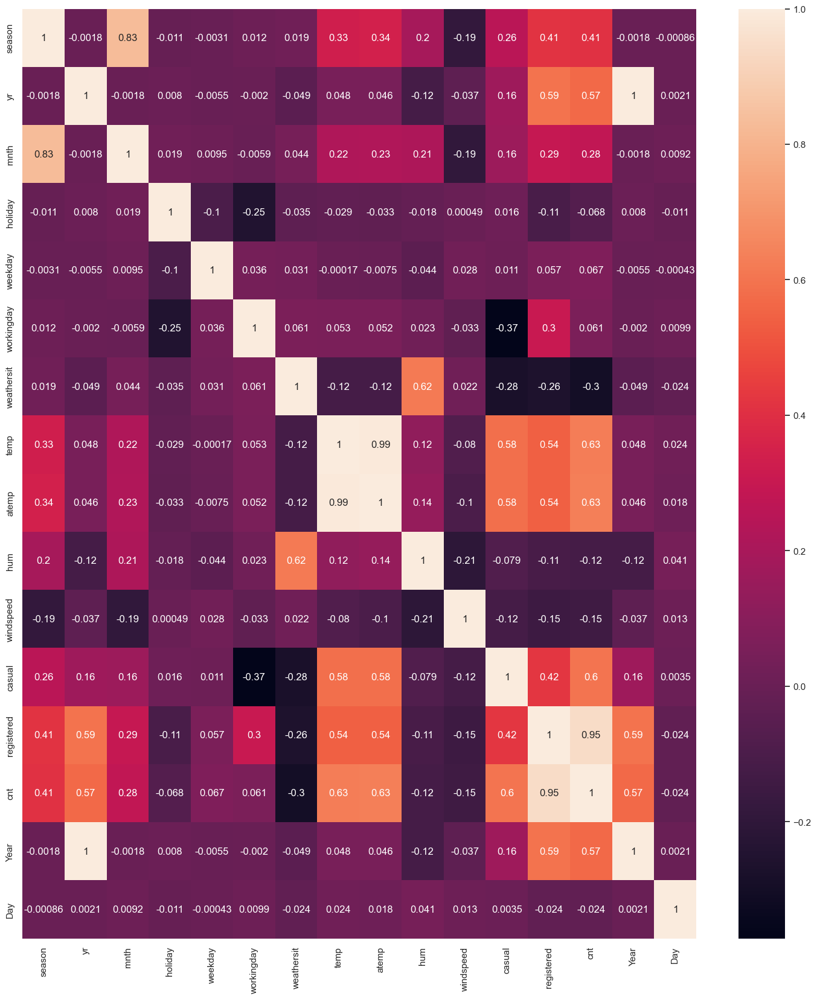

In [157]:
plt.figure(figsize=(18,20)) # Define the plot size
sns.heatmap(d1.corr(),annot=True) # Heatmap check to correlation between features 

#### **Analysis**:-
> * Here two features (atemp,registered) posses correlation more than 90%.
> * Here the features who posses correlation more than 90% should be droped (atemp,registered). 

<Axes: >

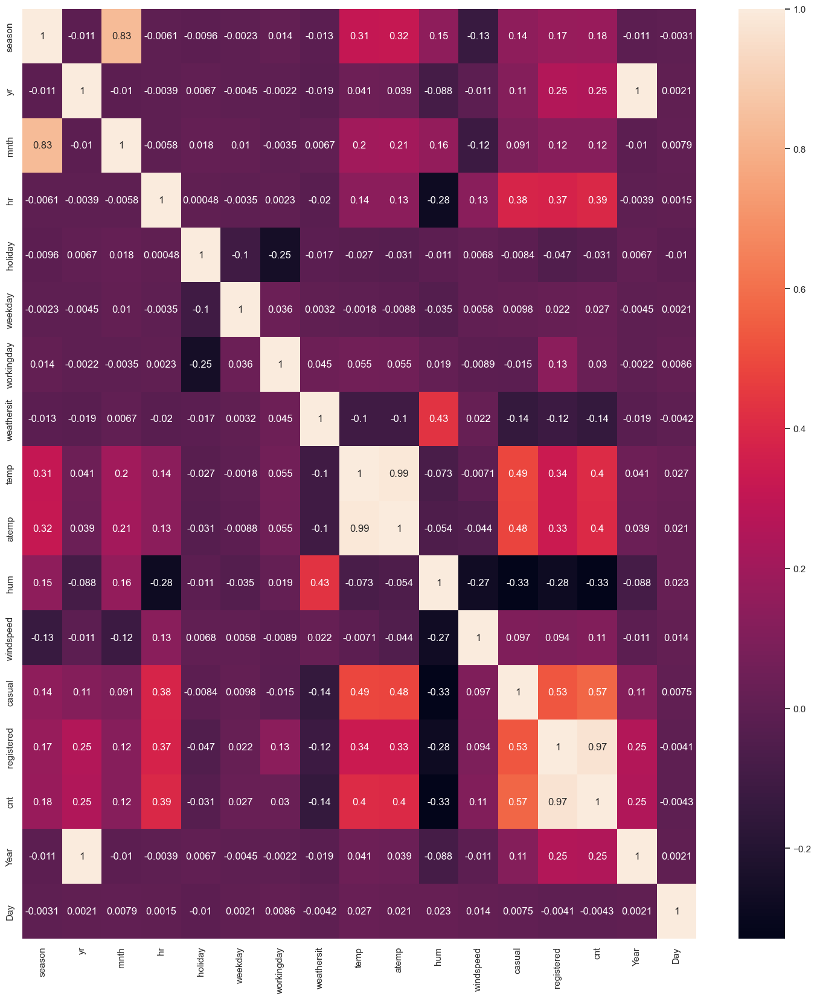

In [160]:
plt.figure(figsize=(18,20)) # define the plot size
sns.heatmap(d2.corr(),annot=True)  # Compute pairwise correlation of columns

#### **Analysis**:-
> * Here two features (atemp,registered) posses correlation more than 90%.
> * Here the features who posses correlation more than 90% should be droped (atemp,registered). 

In [163]:
d1.corr()  #check corrlation

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,Year,Day
season,1.000000,-0.001844,0.831440,-0.010537,-0.003080,0.012485,0.019211,0.334315,0.342876,0.195538,-0.185408,0.258128,0.411623,0.406100,-0.001844,-0.000861
yr,-0.001844,1.000000,-0.001792,0.007954,-0.005461,-0.002013,-0.048727,0.047604,0.046106,-0.123409,-0.037292,0.163970,0.594248,0.566710,1.000000,0.002061
mnth,0.831440,-0.001792,1.000000,0.019191,0.009509,-0.005901,0.043528,0.220205,0.227459,0.214823,-0.192267,0.163407,0.293488,0.279977,-0.001792,0.009157
holiday,-0.010537,0.007954,0.019191,1.000000,-0.101960,-0.253023,-0.034627,-0.028556,-0.032507,-0.018066,0.000485,0.015658,-0.108745,-0.068348,0.007954,-0.010710
weekday,-0.003080,-0.005461,0.009509,-0.101960,1.000000,0.035790,0.031087,-0.000170,-0.007537,-0.043753,0.028306,0.010628,0.057367,0.067443,-0.005461,-0.000428
workingday,0.012485,-0.002013,-0.005901,-0.253023,0.035790,1.000000,0.061200,0.052660,0.052182,0.022663,-0.032669,-0.372235,0.303907,0.061156,-0.002013,0.009907
weathersit,0.019211,-0.048727,0.043528,-0.034627,0.031087,0.061200,1.000000,-0.120602,-0.121583,0.618185,0.021596,-0.277115,-0.260388,-0.297391,-0.048727,-0.023824
temp,0.334315,0.047604,0.220205,-0.028556,-0.000170,0.052660,-0.120602,1.000000,0.991702,0.123719,-0.080123,0.582916,0.540012,0.627494,0.047604,0.024253
atemp,0.342876,0.046106,0.227459,-0.032507,-0.007537,0.052182,-0.121583,0.991702,1.000000,0.137308,-0.099591,0.582033,0.544192,0.631066,0.046106,0.018286
hum,0.195538,-0.123409,0.214823,-0.018066,-0.043753,0.022663,0.618185,0.123719,0.137308,1.000000,-0.207457,-0.079498,-0.112186,-0.121468,-0.123409,0.041214


In [165]:
d2.corr()  # Compute pairwise correlation of columns

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,Year,Day
season,1.000000,-0.010742,0.830386,-0.006117,-0.009585,-0.002335,0.013743,-0.013443,0.312025,0.319380,0.145998,-0.127356,0.144163,0.174226,0.178056,-0.010742,-0.003052
yr,-0.010742,1.000000,-0.010473,-0.003867,0.006692,-0.004485,-0.002196,-0.019449,0.040913,0.039222,-0.088295,-0.010697,0.112443,0.253684,0.250495,1.000000,0.002057
mnth,0.830386,-0.010473,1.000000,-0.005772,0.018430,0.010400,-0.003477,0.006713,0.201691,0.208096,0.161242,-0.120203,0.091247,0.122273,0.120638,-0.010473,0.007929
hr,-0.006117,-0.003867,-0.005772,1.000000,0.000479,-0.003498,0.002285,-0.020244,0.137603,0.133750,-0.277959,0.131741,0.379945,0.374141,0.394071,-0.003867,0.001538
holiday,-0.009585,0.006692,0.018430,0.000479,1.000000,-0.102088,-0.252471,-0.016920,-0.027340,-0.030973,-0.011376,0.006809,-0.008378,-0.047345,-0.030927,0.006692,-0.010132
weekday,-0.002335,-0.004485,0.010400,-0.003498,-0.102088,1.000000,0.035955,0.003182,-0.001795,-0.008821,-0.035342,0.005772,0.009791,0.021578,0.026900,-0.004485,0.002145
workingday,0.013743,-0.002196,-0.003477,0.002285,-0.252471,0.035955,1.000000,0.044761,0.055390,0.054667,0.018631,-0.008903,-0.015111,0.134326,0.030284,-0.002196,0.008627
weathersit,-0.013443,-0.019449,0.006713,-0.020244,-0.016920,0.003182,0.044761,1.000000,-0.101473,-0.104344,0.430126,0.021883,-0.144010,-0.120691,-0.142106,-0.019449,-0.004162
temp,0.312025,0.040913,0.201691,0.137603,-0.027340,-0.001795,0.055390,-0.101473,1.000000,0.987672,-0.072686,-0.007086,0.487413,0.335361,0.404772,0.040913,0.027180
atemp,0.319380,0.039222,0.208096,0.133750,-0.030973,-0.008821,0.054667,-0.104344,0.987672,1.000000,-0.054451,-0.044451,0.481809,0.332559,0.400929,0.039222,0.021269


In [167]:
d1.drop("yr",axis=1,inplace=True)  # Drop specified rows or columns from the DataFrame

In [169]:
d2.drop("yr",axis=1,inplace=True)  # Drop specified rows or columns from the DataFrame

In [171]:
d1

,season,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,Year,Day
0,1,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985,2011,1
1,1,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801,2011,2
2,1,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349,2011,3
3,1,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562,2011,4
4,1,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600,2011,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.190486,247,1867,2114,2012,27
727,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095,2012,28
728,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341,2012,29
729,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.190486,364,1432,1796,2012,30


In [173]:
d2

,season,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,Year,Day
0,1,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16,2011,1
1,1,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40,2011,1
2,1,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32,2011,1
3,1,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13,2011,1
4,1,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1,2011,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119,2012,31
17375,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89,2012,31
17376,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90,2012,31
17377,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61,2012,31


# Model Selection

#### Definition:

> * Model selection is the process of choosing the best machine learning model for a specific task based on its performance with your data. It involves understanding your prediction goal, selecting a few suitable models and it split the dataset in testing and training.

In [176]:
X = d1.drop(["cnt"], axis=1) # Drop the 'cnt' and store the result in 'x' (independent variables)
y = d1.cnt # Store the 'cnt' column in 'y' (dependent variable)

In [178]:
X # Independent variable

,season,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,Year,Day
0,1,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,2011,1
1,1,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,2011,2
2,1,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,2011,3
3,1,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,2011,4
4,1,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,2011,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.190486,247,1867,2012,27
727,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,2012,28
728,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,2012,29
729,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.190486,364,1432,2012,30


In [180]:
y # dependent variable

0       985
1       801
2      1349
3      1562
4      1600
       ... 
726    2114
727    3095
728    1341
729    1796
730    2729
Name: cnt, Length: 731, dtype: int64

In [182]:
from sklearn.model_selection import train_test_split # Import the train test split from sklearn.model_selection 

In [183]:
X_train1,X_test1,y_train1,y_test1 = train_test_split(X,y,test_size=0.2,random_state=40) # Split the data in training and testing 

In [186]:
X_train1

,season,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,Year,Day
462,2,4,0,6,0,1,0.437500,0.426129,0.254167,0.274871,713,3605,2012,7
331,4,11,0,1,1,1,0.503478,0.490122,0.743043,0.142122,253,3614,2011,28
166,2,6,0,4,1,2,0.628333,0.595346,0.688333,0.206471,545,3222,2011,16
106,2,4,0,0,0,1,0.456667,0.445696,0.479583,0.190486,1558,2186,2011,17
719,4,12,0,4,1,2,0.330000,0.335217,0.667917,0.132463,314,3814,2012,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440,1,3,0,5,1,2,0.435833,0.436229,0.842083,0.113192,548,3830,2012,16
165,2,6,0,3,1,1,0.626667,0.587754,0.471667,0.167912,769,4411,2011,15
7,1,1,0,6,0,2,0.165000,0.162254,0.535833,0.266804,68,891,2011,8
219,3,8,0,1,1,1,0.765000,0.703283,0.592083,0.192175,846,3480,2011,8


In [188]:
X_test1

,season,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,Year,Day
120,2,5,0,0,0,2,0.451667,0.448204,0.762083,0.106354,1138,2213,2011,1
498,2,5,0,0,0,1,0.612500,0.585238,0.576250,0.225117,2172,3946,2012,13
450,2,3,0,1,1,1,0.445833,0.438750,0.477917,0.190486,795,4763,2012,26
556,3,7,0,2,1,2,0.720833,0.664796,0.667500,0.151737,954,5336,2012,10
188,3,7,0,5,1,2,0.709167,0.670483,0.757917,0.225129,692,3348,2011,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
423,1,2,0,2,1,1,0.359167,0.353525,0.395833,0.193417,229,4134,2012,28
140,2,5,0,6,0,1,0.602500,0.571975,0.626667,0.120650,2258,3547,2011,21
62,1,3,0,5,1,2,0.261667,0.255679,0.610417,0.203346,214,1730,2011,4
304,4,11,0,2,1,1,0.400833,0.397088,0.683750,0.135571,410,3658,2011,1


In [190]:
y_train1

462    6857
331    3867
166    3767
106    3744
719    4128
       ... 
440    4378
165    5180
7       959
219    4326
326    2566
Name: cnt, Length: 584, dtype: int64

In [192]:
y_test1

120    3351
498    6118
450    5558
556    6290
188    4040
       ... 
423    4363
140    5805
62     1944
304    4068
313    2933
Name: cnt, Length: 147, dtype: int64

In [194]:
# Modelling
from sklearn.metrics import mean_squared_error, r2_score  # Calculate the mean of the selected data
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor
from sklearn.linear_model import LinearRegression, Ridge,Lasso  # Create a Linear Regression model instance
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error  # Calculate the mean of the selected data
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.neural_network import MLPRegressor
import warnings

In [196]:
def evaluate_model(true, predicted):  # Make predictions using the trained model
    mae = mean_absolute_error(true, predicted)  # Calculate the mean of the selected data
    mse = mean_squared_error(true, predicted)  # Calculate the mean of the selected data
    rmse = np.sqrt(mean_squared_error(true, predicted))  # Calculate the mean of the selected data
    r2_square = r2_score(true, predicted)  # Make predictions using the trained model
    return mae, rmse, r2_square

In [198]:
models = {
    "Linear Regression": LinearRegression(),  # Create a Linear Regression model instance
    "Lasso": Lasso(),
    "Ridge": Ridge(),
    "K-Neighbors Regressor": KNeighborsRegressor(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest Regressor": RandomForestRegressor(),
    "XGBRegressor": XGBRegressor(),
    "AdaBoost Regressor": AdaBoostRegressor(),
    "Gradient Boosting Regressor":GradientBoostingRegressor(),
    "Bagging Regressor" : BaggingRegressor(),
     "MLP Regressor" : MLPRegressor()
}

In [200]:
model_list1 = []
r2_list1 =[]

for i in range(len(list(models))):
    model1 = list(models.values())[i]
    model1.fit(X_train1,y_train1)  # Fit the model on training data

    #make prediction
    y_train_pred1 = model1.predict(X_train1)  # Make predictions using the trained model
    y_test_pred1 = model1.predict(X_test1)  # Make predictions using the trained model

    #Evaluate Train and Test Dataset
    model_train_mae1,model_train_rmse1,model_train_r21 = evaluate_model(y_train1,y_train_pred1)

    model_test_mae1,model_test_rmse1,model_test_r21 = evaluate_model(y_test1,y_test_pred1)


    print(list(models.keys())[i])  # Print the output to the console
    model_list1.append(list(models.keys())[i])

    print('Model Performance foor training set')  # Print the output to the console
    print("- Root Mean Squared Error: {:.4f}".format(model_train_rmse1))  # Print the output to the console
    print("- Mean Absolute Error: {:.4f}".format(model_train_mae1))  # Print the output to the console
    print("- R2 Score: {:.4f}".format(model_train_r21))  # Print the output to the console

    print('----------------------------------')  # Print the output to the console
    
    print('Model performance for Test set')  # Print the output to the console
    print("- Root Mean Squared Error: {:.4f}".format(model_test_rmse1))  # Print the output to the console
    print("- Mean Absolute Error: {:.4f}".format(model_test_mae1))  # Print the output to the console
    print("- R2 Score: {:.4f}".format(model_test_r21))  # Print the output to the console
    
    r2_list1.append(model_test_r21)

    print('='*35)  # Print the output to the console
    print('\n')  # Print the output to the console

Linear Regression
Model Performance foor training set
- Root Mean Squared Error: 369.9664
- Mean Absolute Error: 252.1874
- R2 Score: 0.9645
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 296.6197
- Mean Absolute Error: 213.6185
- R2 Score: 0.9736


Lasso
Model Performance foor training set
- Root Mean Squared Error: 370.7231
- Mean Absolute Error: 250.5563
- R2 Score: 0.9643
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 283.9756
- Mean Absolute Error: 208.5095
- R2 Score: 0.9758


Ridge
Model Performance foor training set
- Root Mean Squared Error: 370.8501
- Mean Absolute Error: 250.9466
- R2 Score: 0.9643
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 279.9491
- Mean Absolute Error: 206.2841
- R2 Score: 0.9764


K-Neighbors Regressor
Model Performance foor training set
- Root Mean Squared Error: 363.1219
- Mean Absolute Error: 162.4134
- R2 Score

In [201]:
score1 = pd.DataFrame(list(zip(model_list1, r2_list1)), columns=['Model Name', 'R2_Score']).sort_values(by=["R2_Score"],ascending=False)  # Return the coefficient of determination (R^2) of the prediction

In [204]:
score1.R2_Score = score1.R2_Score*100  # Return the coefficient of determination (R^2) of the prediction

In [206]:
score1  # Return the coefficient of determination (R^2) of the prediction

,Model Name,R2_Score
6,XGBRegressor,99.383324
5,Random Forest Regressor,99.294643
8,Gradient Boosting Regressor,99.062620
9,Bagging Regressor,99.049849
4,Decision Tree,98.254577
2,Ridge,97.644305
1,Lasso,97.576053
0,Linear Regression,97.355394
10,MLP Regressor,96.875389
7,AdaBoost Regressor,95.642824


In [210]:
best_row = score1.loc[score1['R2_Score'].idxmax()]
best_model_name = best_row['Model Name']
print(f"Best model (based on R²): {best_model_name}")
best_model = models[best_model_name]


Best model (based on R²): XGBRegressor


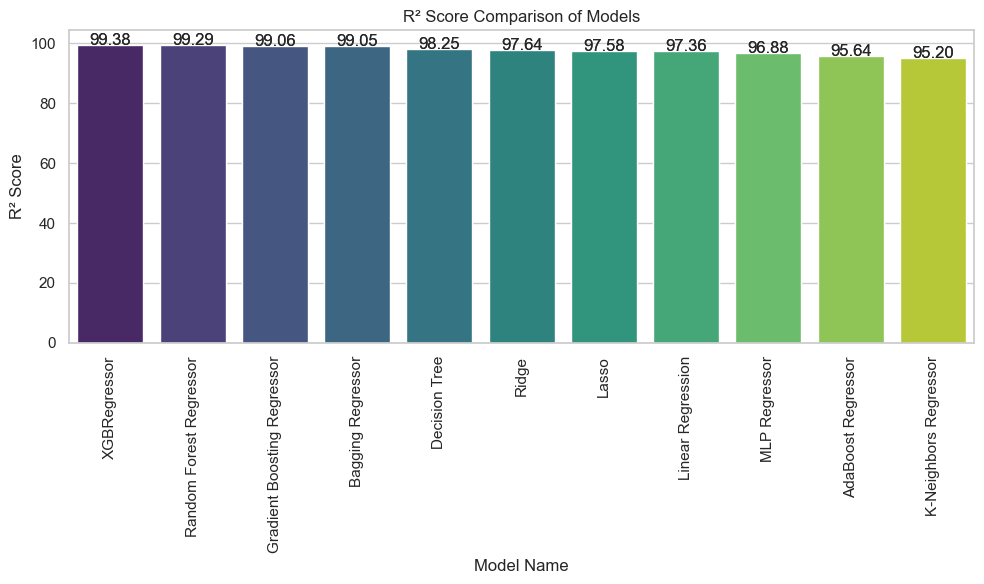

In [212]:
plt.figure(figsize=(10, 6))  # Customize or display the plot
num = 0
for i in score1 :  # Return the coefficient of determination (R^2) of the prediction
    if num <= 7:
        a = sns.barplot(x='Model Name', y='R2_Score', data=score1,palette='viridis')  # Plot the data using a specified type of plot
        plt.title('R² Score Comparison of Models')  # Customize or display the plot
        plt.xlabel('Model Name')  # Customize or display the plot
        plt.ylabel('R² Score')  # Customize or display the plot
        # plt.ylim(0, 1.1)
        plt.xticks(rotation=90)  # Customize or display the plot
        
        for index,value in enumerate(score1['R2_Score']):  # Return the coefficient of determination (R^2) of the prediction
            a.text(index,value + 0.02 , f'{value:.2f}',ha='center')

        num += 1

plt.tight_layout()  # Customize or display the plot
plt.show()  # Customize or display the plot

## Model Comparision Report

>* XGBRegressor takes the lead with an R² score of 99.38%, making it the most accurate and best-performing model among all compared.
>* Random Forest Regressor performs almost equally well with 99.25%, highlighting its strong capability in capturing the data patterns.
>* Decision Tree shows a solid performance (98.43%), demonstrating that even a single tree can be powerful if tuned correctly.
>* Ridge (97.64%) and Lasso (97.58%) regression models also achieve high accuracy, proving to be reliable linear models with regularization.
>* Linear Regression delivers an impressive 97.36%, making it a good baseline model in most regression tasks.
>* AdaBoost Regressor (95.62%) and K-Neighbors Regressor (95.20%) also achieve decent results, though slightly behind the top-tier models.

## Final Report 
> * I have implemented nine algorithms in analysis, which include XGBRegressor,BaggingRegressor,Ridge,Lasso,MlPRgressor,Linear Regression, Decision Tree, Random Forest ,K-Nearest Neighbors (KNN) ,Gradient Boosting,AdaBoostRegressor.
> * I have calculated the R² score, Mean Absolute Error (MAE), and Mean Squared Error (MSE) to evaluate the performance of the best models.
> * The XGBRegressor model has shown outstanding performance, achieving an R² score of 99.38%.
> * Nearly all models demonstrated strong performance, achieving R² scores of over 95%.

In [216]:
X1 = d2.drop(["cnt"], axis=1) # Drop the 'cnt' and store the result in 'x' (independent variables)
y1 = d2.cnt # Store the 'cnt' column in 'y' (dependent variable)

In [218]:
X1

,season,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,Year,Day
0,1,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,2011,1
1,1,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,2011,1
2,1,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,2011,1
3,1,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,2011,1
4,1,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,2011,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,2012,31
17375,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,2012,31
17376,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,2012,31
17377,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,2012,31


In [220]:
y1

0         16
1         40
2         32
3         13
4          1
        ... 
17374    119
17375     89
17376     90
17377     61
17378     49
Name: cnt, Length: 17379, dtype: int64

In [222]:
X_train2,X_test2,y_train2,y_test2 = train_test_split(X1,y1,test_size=0.2,random_state=40) # Split the data in training and testing 

In [224]:
X_train2

,season,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,Year,Day
5972,3,9,9,0,0,0,1,0.66,0.6212,0.74,0.0000,59,168,2011,11
4785,3,7,7,0,6,0,1,0.80,0.7424,0.52,0.1045,7,38,2011,23
7479,4,11,6,0,0,0,1,0.34,0.3333,0.66,0.1343,5,18,2011,13
5478,3,8,4,0,0,0,1,0.68,0.6364,0.83,0.2239,1,5,2011,21
9530,1,2,1,0,2,1,1,0.28,0.2879,0.61,0.1343,8,6,2012,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11532,2,4,17,0,1,1,1,0.56,0.5303,0.60,0.1642,66,617,2012,30
16065,4,11,2,0,3,1,2,0.28,0.2576,0.56,0.2985,6,68,2012,7
14501,3,9,10,0,6,0,2,0.78,0.7273,0.55,0.1940,17,289,2012,1
14555,3,9,16,1,1,0,1,0.74,0.6970,0.70,0.2239,17,335,2012,3


In [226]:
X_test2

,season,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,Year,Day
8986,1,1,7,0,0,0,1,0.12,0.1212,0.54,0.2836,3,14,2012,15
5566,3,8,20,0,3,1,1,0.72,0.6667,0.58,0.2985,45,289,2011,24
15629,4,10,10,0,4,1,2,0.52,0.5000,0.68,0.2239,60,158,2012,18
9804,1,2,11,0,6,0,1,0.32,0.3333,0.57,0.1343,102,184,2012,18
3337,2,5,23,0,1,1,2,0.62,0.5606,0.88,0.1940,19,53,2011,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9505,1,2,23,0,0,0,1,0.24,0.2424,0.70,0.1343,4,38,2012,5
11322,2,4,23,0,6,0,2,0.46,0.4545,0.82,0.2836,18,73,2012,21
3974,2,6,12,0,0,0,2,0.74,0.6818,0.55,0.0896,17,255,2011,19
8139,4,12,19,0,6,0,1,0.26,0.2424,0.38,0.2836,15,139,2011,10


In [228]:
y_train2

5972     227
4785      45
7479      23
5478       6
9530      14
        ... 
11532    683
16065     74
14501    417
14555    500
11590      6
Name: cnt, Length: 13903, dtype: int64

In [230]:
y_test2

8986      17
5566     334
15629    218
9804     286
3337      72
        ... 
9505      42
11322     91
3974     396
8139     154
5675     142
Name: cnt, Length: 3476, dtype: int64

In [232]:
model_list2 = []
r2_list2 =[]

for i in range(len(list(models))):
    model2 = list(models.values())[i]
    model2.fit(X_train2,y_train2)  # Fit the model on training data

    #make prediction
    y_train_pred2 = model2.predict(X_train2)  # Make predictions using the trained model
    y_test_pred2 = model2.predict(X_test2)  # Make predictions using the trained model

    #Evaluate Train and Test Dataset
    model_train_mae2,model_train_rmse2,model_train_r22 = evaluate_model(y_train2,y_train_pred2)

    model_test_mae2,model_test_rmse2,model_test_r22 = evaluate_model(y_test2,y_test_pred2)


    print(list(models.keys())[i])  # Print the output to the console
    model_list2.append(list(models.keys())[i])

    print('Model Performance foor training set')  # Print the output to the console
    print("- Root Mean Squared Error: {:.4f}".format(model_train_rmse2))  # Print the output to the console
    print("- Mean Absolute Error: {:.4f}".format(model_train_mae2))  # Print the output to the console
    print("- R2 Score: {:.4f}".format(model_train_r22))  # Print the output to the console

    print('----------------------------------')  # Print the output to the console
    
    print('Model performance for Test set')  # Print the output to the console
    print("- Root Mean Squared Error: {:.4f}".format(model_test_rmse2))  # Print the output to the console
    print("- Mean Absolute Error: {:.4f}".format(model_test_mae2))  # Print the output to the console
    print("- R2 Score: {:.4f}".format(model_test_r22))  # Print the output to the console
    
    r2_list2.append(model_test_r22)

    print('='*35)  # Print the output to the console
    print('\n')  # Print the output to the console

Linear Regression
Model Performance foor training set
- Root Mean Squared Error: 33.6008
- Mean Absolute Error: 22.3883
- R2 Score: 0.9656
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 32.1883
- Mean Absolute Error: 22.0937
- R2 Score: 0.9687


Lasso
Model Performance foor training set
- Root Mean Squared Error: 34.8965
- Mean Absolute Error: 21.0691
- R2 Score: 0.9629
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 33.3178
- Mean Absolute Error: 20.6451
- R2 Score: 0.9665


Ridge
Model Performance foor training set
- Root Mean Squared Error: 33.6008
- Mean Absolute Error: 22.3810
- R2 Score: 0.9656
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 32.1867
- Mean Absolute Error: 22.0859
- R2 Score: 0.9687


K-Neighbors Regressor
Model Performance foor training set
- Root Mean Squared Error: 20.0437
- Mean Absolute Error: 6.8422
- R2 Score: 0.9878
------

In [233]:
score2 = pd.DataFrame(list(zip(model_list2, r2_list2)), columns=['Model Name','R2_Score']).sort_values(by=["R2_Score"],ascending=False)  # Return the coefficient of determination (R^2) of the prediction

In [234]:
score2.R2_Score = score2.R2_Score*100  # Return the coefficient of determination (R^2) of the prediction

In [235]:
score2  # Return the coefficient of determination (R^2) of the prediction

,Model Name,R2_Score
6,XGBRegressor,99.737680
5,Random Forest Regressor,99.659088
9,Bagging Regressor,99.615808
4,Decision Tree,99.413685
8,Gradient Boosting Regressor,99.393763
10,MLP Regressor,99.186626
3,K-Neighbors Regressor,98.350474
2,Ridge,96.874659
0,Linear Regression,96.874345
1,Lasso,96.651141


In [242]:
best_row = score2.loc[score2['R2_Score'].idxmax()]
best_model_name = best_row['Model Name']
print(f"Best model (based on R²): {best_model_name}")
best_model1 = models[best_model_name]


Best model (based on R²): XGBRegressor


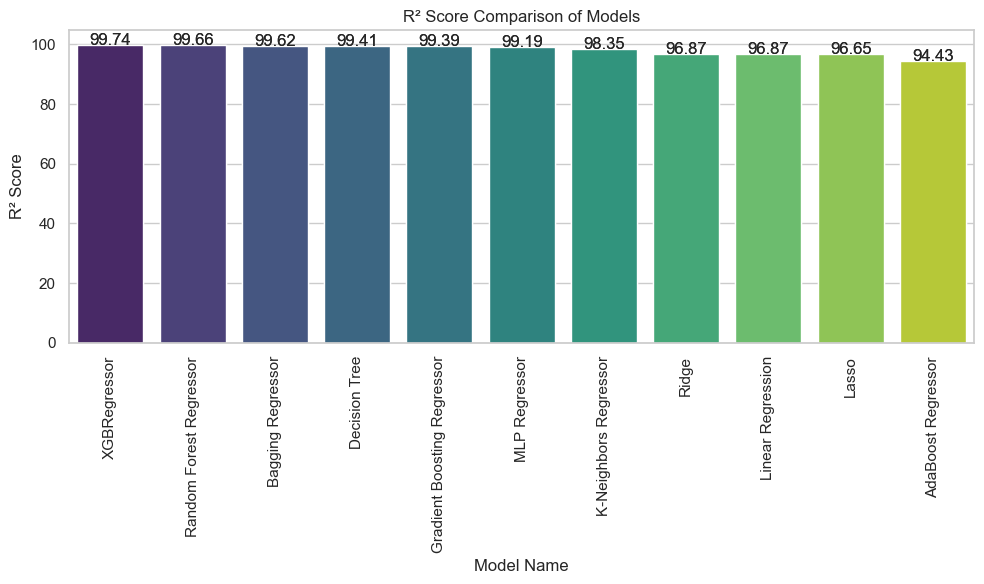

In [244]:
plt.figure(figsize=(10, 6))  # Customize or display the plot
num = 0
for i in score2 :  # Return the coefficient of determination (R^2) of the prediction
    if num <= 7:
        a = sns.barplot(x='Model Name', y='R2_Score', data=score2,palette='viridis')  # Plot the data using a specified type of plot
        plt.title('R² Score Comparison of Models')  # Customize or display the plot
        plt.xlabel('Model Name')  # Customize or display the plot
        plt.ylabel('R² Score')  # Customize or display the plot
        # plt.ylim(0, 1.1)
        plt.xticks(rotation=90)  # Customize or display the plot
        
        for index,value in enumerate(score2['R2_Score']):  # Return the coefficient of determination (R^2) of the prediction
            a.text(index,value + 0.02 , f'{value:.2f}',ha='center')

        num += 1

plt.tight_layout()  # Customize or display the plot
plt.show()  # Customize or display the plot

#### **Analysis**:-
>* XGBRegressor secures the top position with an R² score of 99.74%, indicating excellent predictive accuracy and performance.
>* Random Forest Regressor follows closely with 99.67%, proving to be another highly reliable ensemble model.
>* Decision Tree also performs strongly with 99.39%, showing that even a single-tree model can yield robust results.
>* K-Neighbors Regressor achieves 98.35%, demonstrating that instance-based learning methods can work well in this dataset.
>* Ridge and Linear Regression both tie at 96.87%, making them strong regularized linear models.
>* Lasso scores 96.65%, slightly below Ridge but still highly accurate.
>* AdaBoost Regressor, while the lowest in this set, still holds a respectable 94.27%, showing it can be a viable option depending on the use-case.

## Model Comparision Report
> * I have implemented nine algorithms in analysis, which include XGBRegressor,BaggingRegressor,Ridge,Lasso,MlPRgressor,Linear Regression, Decision Tree, Random Forest ,K-Nearest Neighbors (KNN) ,Gradient Boosting,AdaBoostRegressor.
> * I have calculated the R² score, Mean Absolute Error (MAE), and Mean Squared Error (MSE) to evaluate the performance of the best models.
> * The XGBRegressor model has shown outstanding performance, achieving an R² score of 99.74%.
> * Nearly all models demonstrated strong performance, achieving R² scores of over 95% only AdaBoostRegressor have 93.96%

### Report on Challenges faced
> * Outliers are present in both the "hum","windspeed", "casual" features, which may lead to issues with the data
> * A challenge was converting the 'dteday' column to datetime and then to int64 while ensuring data accuracy.
> * The Support Vector Machine (SVM) model exhibited poor performance, achieving an R² score of just 7.35%.
> * I was unable to perform hyperparameter tuning due to certain constraints.

In [256]:
import pickle                             #Importing the pickle module
with open('best_model.pkl', 'wb') as file:
    pickle.dump(best_model, file)                                         #save it to the file

In [258]:
import pickle                             #Importing the pickle module
with open('best_model1.pkl', 'wb') as file:
    pickle.dump(best_model, file)                      

In [260]:

with open("best_model.pkl","rb") as f:   #Open the file "best_model.pkl" in read-binary mode
    model=pickle.load(f)
    

In [262]:

with open("best_model1.pkl","rb") as f:   #Open the file "best_model.pkl" in read-binary mode
    model1=pickle.load(f)
    

In [264]:
model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [266]:
model1

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)